In [1]:
import numpy as np
import pandas as pd
import ast
from collections import deque
import syn_envAgent

from syn_envAgent import OptimalPolicyAgent,RandomAgent,Q_learning_Agent,DQNAgentnew
from syn_envAgent import PPOAgent,MetaDQNAgent

import syn_env
from syn_env import GeneratedENV


import warnings
warnings.filterwarnings('ignore')

/Users/veetin/Desktop/drifttest_pa/main/syn_env.py:62: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  frequencies[label][action] = ast.literal_eval(frequencies[label][action]) #判断需要计算的内容是不是合法的Python类型，如果是则执行，否则就报错


In [33]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.cm as cm
def compare_agents_plot(reward_lists, labels,type):
    """
    reward_lists: list of 1D lists or arrays of episodic rewards for each agent
    labels: list of labels for each agent (e.g., ["Random", "Q-Learning", "Value Iteration", "Policy Iteration"])
    """
    def smooth(arr):
        arr = np.array(arr)
        return pd.Series(arr).rolling(window=80).mean()
    
    x = np.arange(1, 2101)  # 100 segments
    colors = cm.plasma(np.linspace(0, 0.9, len(reward_lists)))
    
    # 创建两个子图
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 12))  # 总宽度24以容纳两个12宽的图
    
        # 第二个图：不使用smooth
    for rewards, label, color in zip(reward_lists, labels, colors):
        y = rewards
        ax1.plot(x, y, label=label, color=color, alpha=0.7)  # 添加透明度使原始数据更易读
    
    ax1.axvline(x=700, color='red', linestyle='--', label='drift happens')
   # ax2.axvline(x=1400, color='red', linestyle='--', label='gradual drift ends')
    if type == 'reward':
        ax1.set_title("Compare different agent performance by reward (Raw Data)")
        ax1.set_xlabel("Episodes")
        ax1.set_ylabel("Episodic Reward")
    elif type =='length':
        ax1.set_title("Compare different agent performance by step length (Raw Data)")
        ax1.set_xlabel("Episodes")
        ax1.set_ylabel("Episodic step length")
    ax1.legend()
    ax1.grid(True)
    
    # 第一个图：使用smooth
    for rewards, label, color in zip(reward_lists, labels, colors):
        y = smooth(rewards)
        ax2.plot(x, y, label=label, color=color)
    
    ax2.axvline(x=700, color='red', linestyle='--', label=' drift happens')
   # ax1.axvline(x=1400, color='red', linestyle='--', label='gradual drift ends')
    if type == 'reward':
        ax2.set_title("Compare different agent performance by reward (Smoothed - 30 window size)")
        ax2.set_xlabel("Episodes")
        ax2.set_ylabel("Average Episodic Reward")
    if type =='length':
        ax2.set_title("Compare different agent performance by step length (Smoothed - 30 window size)")
        ax2.set_xlabel("Episodes")
        ax2.set_ylabel("Average Episodic Step Length")

    ax2.legend()
    ax2.grid(True)
    
    
    plt.tight_layout()
    plt.show()

In [34]:
from typing import List
import numpy as np

def reward_to_score(r: float, r_opt: float, r_min: float) -> float:
    """归一化 reward 为正向 score（越大越好）"""
    return (r - r_min) / (r_opt - r_min)

def check_recovery_negative_rewards(
    opt_pre_drift: List[float],
    agent_pre_drift: List[float],
    #random_pre_drift: List[float],
    opt_post_drift: List[float],
    agent_post_drift: List[float],
    window_size: int = 50,
    consecutive_required: int = 200
):
    # Step 1: 计算 pre-drift 和 post-drift 的平均 reward
    r_opt_pre = np.mean(opt_pre_drift)
    r_agent_pre = np.mean(agent_pre_drift)

    for i in range(0,2):

        r_opt_post = np.mean(opt_post_drift[i])

        # Step 2: 找到合理的 reward 下界，用于归一化
        r_min = min(min(agent_pre_drift), min(opt_pre_drift),
                    min(agent_post_drift[i][:-100]), min(opt_post_drift[i])) - 1 # 避免除以0

        #print("the value compute stander",r_agent_pre, r_opt_pre, r_min)
        # Step 3: 计算 pre-drift agent 的标准表现分数 alpha
        #score_opt_pre = reward_to_score(r_opt_pre, r_opt_pre, r_min)  # 始终为1
        score_agent_pre = reward_to_score(r_agent_pre, r_opt_pre, r_min)
        alpha = score_agent_pre
       # print('the alpha value:', alpha)
        # Step 4: 设定恢复标准（90% of pre-drift performance）
        recovery_threshold = 0.95 * alpha

        # Step 5: 对 post-drift agent 的 reward 做 rolling window
        recovery_streak = 0
        windows_rolled = 0
        recovered = False

        for j in range(len(agent_post_drift[i]) - window_size + 1):
            window = agent_post_drift[i][j : j + window_size]
            window_mean = np.mean(window)
            window_score = reward_to_score(window_mean, r_opt_post, r_min)
            windows_rolled += 1

            if window_score >= recovery_threshold:
                recovery_streak += 1
                if recovery_streak == consecutive_required:
                    recovered = True
                    break
            else:
                recovery_streak = 0

        
        print(f"Agent pre-drift average reward: {r_agent_pre:.3f}")
        print(f"Optimal pre-drift average reward: {r_opt_pre:.3f}")
        print(f"Recovery standard (90% of relative performance): {recovery_threshold:.3f}")
        print(f"Recovered: {recovered}")
        if recovered:
            print(f"Recovery achieved in {windows_rolled} windows")
        else:
            print(f"Recovery not achieved in {windows_rolled} windows")
        print("========== RECOVERY EVALUATION ==========")
        
    """
    return {
        "standard": recovery_threshold,
        "recovered": recovered,
        "recovery_steps": windows_rolled if recovered else None
    }
"""

In [40]:
#run agent with already generated drifted env
def run_agent_apply_drift(agent_type,apply_drift=True,add_actions=0, change_at_states=['pp'], drift_dis_type='random',intensity = 0.7,drift_type='sudden'):
    #initial agent
    env = GeneratedENV()
    state_dim = len(env.states) 
    action_dim = len(env.motions)  
    state_to_index = {state: idx for idx, state in enumerate(env.states)}
    agent = None
    
    
    match agent_type:
        case 'Q':
            agent = Q_learning_Agent(env)
        case 'DQN':
            #agent = DQNAgent(state_dim,action_dim)
            agent = DQNAgentnew(env)
        case 'PPO':
            agent = PPOAgent(state_dim,action_dim)
        case 'Opt':
            agent = OptimalPolicyAgent(env)
            agent.value_iteration()
           # for state, action in agent.policy.items():
               # print(f"In state {state}, take action: {action}")
        case 'R':
            agent = RandomAgent(env)
        case 'MetaDQN':
            agent = MetaDQNAgent(env)
  
    
    episode_rewards = []
    episode_lengths = []
    episodic_trojactory = []
    information = {}


    total_episodes = 2100
    drift_episode = 700#在第700个episode触发drift

    update_interval=80  #for PPO

    change_at_states = [np.random.choice(env.choice_positions,size=10)]
   # env.drift(add_actions=0, change_at_states=change_at_states, drift_dis_type='random',intensity = 0.7,drift_type='sudden')

    suffix = f"changestate{change_at_states}_{agent_type}"
    for episode in range(total_episodes):
        steps = 0
        # 应用drift
        if apply_drift and episode == drift_episode:             
            env.set_flag()
            #env.drift(add_actions=0, change_at_states=['pp'], drift_dis_type='similar',intensity = 0.7,drift_type='sudden')
            
            env.drift_type=drift_type
            #frequencies = pd.read_csv("./agent_result/agent_result\changestate['pp']_Q_MDP.csv", index_col=0)
            env.drift(add_actions=0, change_at_states=change_at_states, drift_dis_type='random',intensity = 0.7,drift_type='sudden')

            
            print(f"Drift applied at episode {episode}")
            if agent_type =='Opt':
                print('reset the optimal oplicy for policy iteration model.')
                agent.value_iteration()
                #print('new optimal policy:')
                """    
                suffix = f"{agent_type}_{apply_drift}_{change_at_states}_{drift_dis_type}"
                save_to_csv(agent.policy, f"{suffix}_optpolicy.csv")
                """

        if apply_drift and drift_type == 'gradual' and episode == drift_episode+700:
                #swap to another distribution after 100 episode
            env.drift_swap = True
            env.observation_space = env.observation_space_drift.copy(deep=True)
            if agent_type =='Opt':
                print('reset the optimal oplicy for policy iteration model.')
                agent.value_iteration()
                

        state = env.reset()
        episode_reward = 0
        done = False
        
        while not done:
            if agent_type == 'Q':
               # print(agent)
                action = agent.select_action(state)
            elif agent_type in['R','Opt']:
                action = agent.act(state)
            elif agent_type =='DQN':
                #action = agent.get_action(state, state_to_index)
                action = agent.act(state)
            elif agent_type =='PPO':
                action, log_prob, value = agent.select_action(state)
            elif agent_type =='MetaDQN':
                action = agent.act(state)
            
            
            next_state, reward, done, info = env.step(action)
           
            
            if info != []:
                key = ''.join(str(x) for x in info)
                if key not in information:
                    information[key] = 1
                else:
                    information[key] += 1
            if agent_type == 'Q':
            
                agent.learn(state, action, next_state, reward, done)
            elif agent_type== 'DQN':
             
                agent.remember(state, action, reward, next_state, done)
                loss = agent.replay()
                if loss:
                    agent.loss_history.append(loss)
                
                #agent.train(batch_size=1, state_to_index=state_to_index)
            elif agent_type =='PPO':
                #print('train agent PPO')
                agent.store_transition(state, action, reward, log_prob, value, done)
            elif agent_type =='MetaDQN':
                agent.remember(state, action, reward, next_state, done)
                # Standard replay
                loss = agent.replay()
                if loss:
                    agent.loss_history.append(loss)
                # Meta-update less frequently
                if episode % 10 == 0:
                    agent.meta_update()
                            # Update target network periodically
                if episode% agent.update_target_every == 0:
                    agent.target_model.load_state_dict(agent.model.state_dict())
                # Decay epsilon
                if agent.epsilon > agent.epsilon_min:
                    agent.epsilon *= agent.epsilon_decay
                  
            state = next_state
    
            episode_reward += reward
            steps +=1
        if agent_type=='PPO':
            if (episode + 1) % update_interval == 0:
                agent.update()
                agent.clear_memory()
            
        episodic_trojactory.append(info)
        episode_lengths.append(steps)
        episode_rewards.append(episode_reward)
    
    return episode_rewards, episode_lengths,information,episodic_trojactory



def run_agent_avg(agent_type, apply_drift=True, add_actions=0, 
                  change_at_states= None, 
                  drift_dis_type='random', intensity=0.7, drift_type='sudden'):
    
    num_runs = 2
    all_rewards = []
    all_lengths = []
    info_first_run = None

    for run in range(num_runs):
        #print('current run time ',run)
        rewards, lengths, info, trojactory= run_agent_apply_drift(
            agent_type=agent_type,
            apply_drift=apply_drift,
            add_actions=add_actions,
            change_at_states=change_at_states,
            drift_dis_type=drift_dis_type,
            intensity=intensity,
            drift_type=drift_type
        )
        all_rewards.append(rewards)
        all_lengths.append(lengths)
        if run == 0:
            info_first_run = info
            trojactory_first_run = trojactory

    # Convert to numpy arrays for averaging
    all_rewards = np.array(all_rewards)
    all_lengths = np.array(all_lengths)

    avg_rewards = np.mean(all_rewards, axis=0).tolist()
    avg_lengths = np.mean(all_lengths, axis=0).tolist()


    return avg_rewards, avg_lengths #info_first_run,trojactory_first_run

In [41]:
import random

In [42]:

def test_all_agents():
    agent_types = ['R', 'Q', 'DQN', 'PPO','MetaDQN','Opt']
    compare_rewards = []
    compare_lengths = []
    std_rewds = []
    std_lens = []
    change_at_state = [f"S{i}" for i in random.sample(range(1, 51), 15)]
#for compute if the agent recover
    rew_before_drift = [] #per agent
    rewlist_drift = []
    fullrewlist_drift=[]

    for agent_type in agent_types:
        print(f"Running agent_type={agent_type}")
        rewards, lengths = run_agent_avg(agent_type=agent_type, apply_drift=True,change_at_states=change_at_state,
                                                          drift_dis_type='similar',drift_type='sudden')
        compare_rewards.append(rewards)
        compare_lengths.append(lengths)
        std_rewds.append(np.std(rewards))
        std_lens.append(np.std(lengths))

        
        rew_before_drift.append(rewards[600:700])
        rewlist_drift.append([rewards[-100:]])
        fullrewlist_drift.append([rewards[1400:]])

        """"
        suffix = f"{agent_type}_[pp]_None"
        #save_to_csv(opt_agent.policy, f"{suffix}_optpolicy.csv")
        save_to_csv(rewards, f"{suffix}_rewards.csv")
        save_to_csv(lengths, f"{suffix}_lengths.csv")
        save_to_csv([[k, v] for k, v in info.items()], f"{suffix}_info.csv")
               
        df = pd.DataFrame(trojactory)
        df.to_csv(f"./diffagent_res_gradual_random/{suffix}_trojactory.csv", index=True, header=True) 
  
    df = pd.DataFrame([std_rewds, std_lens])
    df.index = ['std_rews', 'std_lens']
    df.to_csv(f"./stdRewLen/stdinverse.csv", index=True, header=True)"""

    compare_agents_plot(compare_rewards, agent_types,'reward')
   # compare_agents_plot(compare_lengths, agent_types,'length')

    for i in range(1,6):
        print('analysis for agent type:',agent_types[i])
        check_recovery_negative_rewards(
        rew_before_drift[-1],
        rew_before_drift[i],
        rewlist_drift[-1],
        fullrewlist_drift[i])
    

Running agent_type=R
Drift applied at episode 700
Drift applied at episode 700
Running agent_type=Q
Drift applied at episode 700
Drift applied at episode 700
Running agent_type=DQN
Drift applied at episode 700
Drift applied at episode 700
Running agent_type=PPO
Drift applied at episode 700
Drift applied at episode 700
Running agent_type=MetaDQN
Drift applied at episode 700
Drift applied at episode 700
Running agent_type=Opt
Drift applied at episode 700
reset the optimal oplicy for policy iteration model.
Drift applied at episode 700
reset the optimal oplicy for policy iteration model.


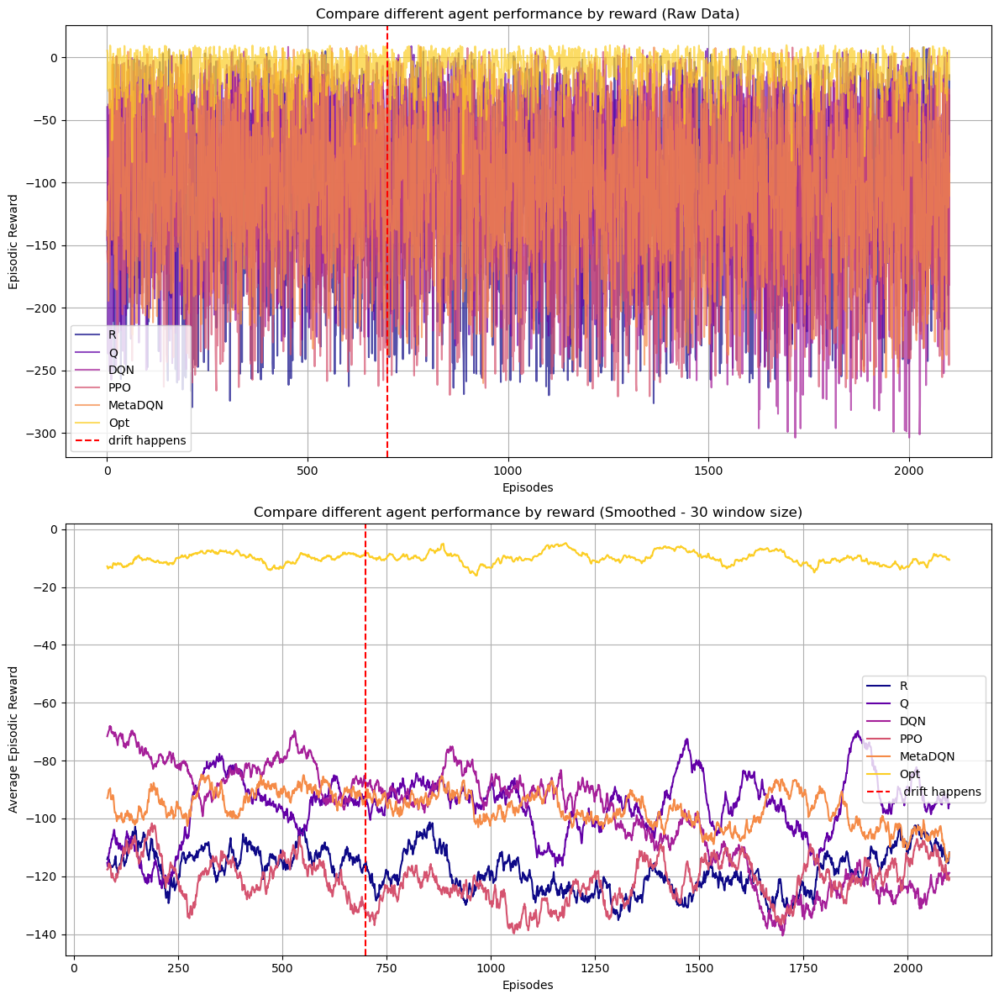

analysis for agent type: Q
Agent pre-drift average reward: -93.032
Optimal pre-drift average reward: -8.640
Recovery standard (90% of relative performance): 0.608
Recovered: False
Recovery not achieved in 651 windows
========== RECOVERY EVALUATION ==========


IndexError: list index out of range

In [43]:
test_all_agents()

In [8]:
change_at_state = [f"S{i}" for i in random.sample(range(1, 51), 15)]
rewards, lengths, std_rew,std_len = run_agent_avg(agent_type='DQN', apply_drift=True,change_at_states=change_at_state,
                                                          drift_dis_type='similar',drift_type='sudden')


Caching the list of root modules, please wait!
(This will only be done once - type '%rehashx' to reset cache!)

Drift applied at episode 700
Drift applied at episode 700
Drift applied at episode 700


KeyboardInterrupt: 

In [9]:
import syn_envaction
from syn_envaction import GeneratedENVA
from agent_dynaaction import RandomMaskedAgent, MaskedQLearningAgent,MaskedDQNAgent,PPOAgentMask,ValueIterationAgent,MetaMaskedDQNAgent

In [10]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.cm as cm

def compare_agents_plot_action(reward_lists, labels,type):
    """
    reward_lists: list of 1D lists or arrays of episodic rewards for each agent
    labels: list of labels for each agent (e.g., ["Random", "Q-Learning", "Value Iteration", "Policy Iteration"])
    """
    def smooth(arr):
        arr = np.array(arr)
        return pd.Series(arr).rolling(window=40).mean()
    
    x = np.arange(1, 2101)  # 100 segments
    colors = cm.plasma(np.linspace(0, 0.9, len(reward_lists)))
    
    # 创建两个子图
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 12))  # 总宽度24以容纳两个12宽的图
    
        # 第二个图：不使用smooth
    for rewards, label, color in zip(reward_lists, labels, colors):
        y = rewards
        ax1.plot(x, y, label=label, color=color, alpha=0.7)  # 添加透明度使原始数据更易读
    
    ax1.axvline(x=700, color='red', linestyle='--', label='disable 2 actions')
    ax1.axvline(x=1400, color='red', linestyle='--', label='add 2 actions')
    if type == 'reward':
        ax1.set_title("Compare different agent performance by reward (Raw Data)")
        ax1.set_xlabel("Episodes")
        ax1.set_ylabel("Episodic Reward")
    elif type =='length':
        ax1.set_title("Compare different agent performance by step length (Raw Data)")
        ax1.set_xlabel("Episodes")
        ax1.set_ylabel("Episodic step length")
    ax1.legend()
    ax1.grid(True)
    
    # 第一个图：使用smooth
    for rewards, label, color in zip(reward_lists, labels, colors):
        y = smooth(rewards)
        ax2.plot(x, y, label=label, color=color)
    
    ax2.axvline(x=700, color='red', linestyle='--', label='disable 2 actions')
    ax2.axvline(x=1400, color='red', linestyle='--', label='add 2 actions')
    if type == 'reward':
        ax2.set_title("Compare different agent performance by reward (Smoothed - 30 window size)")
        ax2.set_xlabel("Episodes")
        ax2.set_ylabel("Average Episodic Reward")
    if type =='length':
        ax2.set_title("Compare different agent performance by step length (Smoothed - 30 window size)")
        ax2.set_xlabel("Episodes")
        ax2.set_ylabel("Average Episodic Step Length")

    ax2.legend()
    ax2.grid(True)
    
    
    plt.tight_layout()
    plt.show()

In [11]:
def run_agent_apply_drift_action(agent_type,apply_drift=True, change_at_states=['pp'], drift_dis_type='random',intensity = 0.7,drift_type='sudden'):
    #initial agent
    env = GeneratedENVA()
    state_dim = len(env.states) 
    action_dim = len(env.motions)  
    state_to_index = {state: idx for idx, state in enumerate(env.states)}
    agent = None
    max_action_dim = 120
    
    match agent_type:
        case 'Q':
            agent = MaskedQLearningAgent(env)
        case 'DQN':
            agent = MaskedDQNAgent(env, state_dim, lr=1e-3, epsilon_decay=0.998)
        case 'PPO':
            agent = PPOAgentMask(env,state_dim, max_action_dim)
        case 'Opt':
            agent = ValueIterationAgent(env)
            agent.value_iteration()
        case 'R':
            agent = RandomMaskedAgent(env)
        case 'MetaDQN':
            agent = MetaMaskedDQNAgent(env)
  
    
    episode_rewards = []
    episode_lengths = []
    episodic_trojactory = []
    information = {}

    total_episodes = 2100
    drift_episodes=[700,1400]
    update_interval=20  #for PPO
    episode_meta_losses = []

    disable_actions = np.random.choice(
        env.motions[:-20],
        size=10)

    suffix = f"changestate{change_at_states}_{agent_type}"

    for episode in range(total_episodes):
        steps = 0
        # 应用drift
        if apply_drift:             
            env.set_flag()  # Enable drift
            
            # Example: Remove 2 actions by disabling them
            if episode == drift_episodes[0]:
                env.drift(add_actions=-10, 
                        drift_type='sudden',
                        disable_actions=disable_actions)
             #   print('finish disable action')
                if agent_type =='Opt':
                    agent.value_iteration()
                    print(agent.policy)

            if episode == drift_episodes[1]:
                env.drift(add_actions=20, drift_type='sudden')
              #  print('finish add action')
                if agent_type =='Opt':
                    agent.value_iteration()
                

        """    
                suffix = f"{agent_type}_{apply_drift}_{change_at_states}_{drift_dis_type}"
                save_to_csv(agent.policy, f"{suffix}_optpolicy.csv")
        """
        if agent == 'MetaDQN':
                        # 重置目标网络以加速适应新环境
            agent.target_net.load_state_dict(agent.policy_net.state_dict())

        state = env.reset()
        episode_reward = 0
        done = False
        
        while not done:
            action_mask = env.get_action_mask()
        
            if agent_type == 'Q':
               # print(agent)
                action = agent.select_action(state,action_mask)

            elif agent_type in['R']:
                action = agent.select_action()
            
            elif agent_type == 'Opt':
                action = agent.select_action(state)

            elif agent_type =='DQN':
                action = agent.act(state, action_mask)

            elif agent_type =='PPO':
                action, log_prob, value = agent.select_action(state, action_mask)

            elif agent_type =='MetaDQN':
                use_meta_weights = (episode in drift_episodes)  # 在漂移发生时使用元学习权重
                action = agent.act(state, action_mask, fast_adapt=use_meta_weights)
            
                #action = agent.act(state)
            
            
            next_state, reward, done, info = env.step(action)
            
            if info != []:
                key = ''.join(str(x) for x in info)
                if key not in information:
                    information[key] = 1
                else:
                    information[key] += 1
            if agent_type == 'Q':
                #print(agentt
                if not done:
                    next_action_mask = env.get_action_mask()
                else:
                    next_action_mask = [True] * len(env.motions)  # Doesn't matter for terminal state
                agent.update(state, action, reward, next_state, next_action_mask, done)


            elif agent_type== 'DQN':
                agent.remember(state, action, reward, next_state, done, action_mask)
                #agent.train(batch_size=1, state_to_index=state_to_index)
                loss = agent.replay()

                
            elif agent_type =='PPO':
                agent.store_transition(state, action, reward, log_prob, value, done, action_mask)


            elif agent_type =='MetaDQN':
            # 存储经验
                agent.remember(state, action, reward, next_state, done,action_mask)
                
                # 常规经验回放
                loss = agent.replay()
                
                # 元学习训练（在漂移发生后加强元学习）
                if (episode in drift_episodes) or (episode % 10 == 0):  # 漂移时或定期执行
                    meta_loss = agent.meta_update()
                    if meta_loss is not None:
                        episode_meta_losses.append(meta_loss)
                  
            state = next_state
            episode_reward += reward
            steps +=1
        if agent_type=='PPO':
            if (episode + 1) % update_interval == 0:
                agent.update()
                agent.clear_memory()

            
        episodic_trojactory.append(info)
        episode_lengths.append(steps)
        episode_rewards.append(episode_reward)
    
   # print('len of episodic rewards',len(episode_rewards))
    
    return episode_rewards, episode_lengths,information,episodic_trojactory

#env = GeneratedENVA()

def run_agent_avg_action(agent_type, apply_drift=True, 
                  drift_dis_type='random', intensity=0.7, drift_type='sudden'):
    
    num_runs = 2
    all_rewards = []
    all_lengths = []
    info_first_run = None

    for run in range(num_runs):
        rewards, lengths, info, trojactory= run_agent_apply_drift_action(
            agent_type=agent_type,
            apply_drift=apply_drift,
            drift_dis_type=drift_dis_type,
            intensity=intensity,
            drift_type=drift_type
        )
        all_rewards.append(rewards)
        all_lengths.append(lengths)
        if run == 0:
            info_first_run = info
            trojactory_first_run = trojactory

    # Convert to numpy arrays for averaging
    all_rewards = np.array(all_rewards)
    all_lengths = np.array(all_lengths)

    avg_rewards = np.mean(all_rewards, axis=0).tolist()
    #print('len of avg rewards',len(avg_rewards))
    avg_lengths = np.mean(all_lengths, axis=0).tolist()

    sd_rewards = np.std(all_rewards, axis=0).tolist()
    sd_lengths = np.std(all_lengths, axis=0).tolist()

    return avg_rewards, avg_lengths, sd_rewards, sd_lengths #info_first_run,trojactory_first_run

In [12]:
avg_rewards, avg_lengths, sd_rewards, sd_lengths = run_agent_avg_action('Q', apply_drift=True)


Disabled actions: ['A93' 'A32' 'A75' 'A13' 'A86' 'A16' 'A5' 'A23' 'A79' 'A49']
Added 20 new actions: ['a0', 'a1', 'a2', 'a3', 'a4', 'a5', 'a6', 'a7', 'a8', 'a9', 'a10', 'a11', 'a12', 'a13', 'a14', 'a15', 'a16', 'a17', 'a18', 'a19']
Disabled actions: ['A31' 'A25' 'A80' 'A76' 'A66' 'A12' 'A93' 'A28' 'A46' 'A61']
Added 20 new actions: ['a0', 'a1', 'a2', 'a3', 'a4', 'a5', 'a6', 'a7', 'a8', 'a9', 'a10', 'a11', 'a12', 'a13', 'a14', 'a15', 'a16', 'a17', 'a18', 'a19']


In [13]:
avg_rewards, avg_lengths

([-102.93585516857961,
  -163.3313954020174,
  -60.707214137817765,
  -103.1997440595947,
  -138.58883130943073,
  -43.40987595997655,
  -111.36468252926598,
  -61.15675621438883,
  -111.6354134719596,
  -260.55866459178253,
  -129.34321002932205,
  -57.04076377454113,
  -338.0492961337041,
  -48.255165685662654,
  -46.66023460193469,
  -8.046852886302911,
  -40.38365557754791,
  -272.0680672082842,
  -116.9099206452621,
  -211.73016603118344,
  -97.81271345279455,
  -197.9371751730602,
  -384.61840471736826,
  -138.31485776483936,
  -189.2563881826385,
  -33.5029321368914,
  -151.09150739319753,
  -9.178732237504022,
  -159.0639334548822,
  -202.19964070706715,
  -313.47266937278977,
  -466.76279367906056,
  -45.972367802103044,
  -42.03079701178557,
  -143.17997514984506,
  -23.41185754106867,
  -195.63900609407256,
  -60.65986157580282,
  -114.47355698363465,
  -92.10881996539862,
  -83.07799713470703,
  -134.10201189697355,
  -48.51409696801013,
  -119.01887052087874,
  -111.935579

In [18]:
def check_recovery_negative_rewards_action(
    opt_pre_drift: List[float],
    agent_pre_drift: List[float],
    #random_pre_drift: List[float],
    opt_post_drift: List[float],
    agent_post_drift: List[float],
    window_size: int = 50,
    consecutive_required: int = 200
):
    # Step 1: 计算 pre-drift 和 post-drift 的平均 reward
    r_opt_pre = np.mean(opt_pre_drift)
    r_agent_pre = np.mean(agent_pre_drift)

    for i in range(0,2):

        r_opt_post = np.mean(opt_post_drift[i])

        # Step 2: 找到合理的 reward 下界，用于归一化
        r_min = min(min(agent_pre_drift), min(opt_pre_drift),
                    min(agent_post_drift[i][:-100]), min(opt_post_drift[i])) - 1 # 避免除以0

        #print("the value compute stander",r_agent_pre, r_opt_pre, r_min)
        # Step 3: 计算 pre-drift agent 的标准表现分数 alpha
        #score_opt_pre = reward_to_score(r_opt_pre, r_opt_pre, r_min)  # 始终为1
        score_agent_pre = reward_to_score(r_agent_pre, r_opt_pre, r_min)
        alpha = score_agent_pre
       # print('the alpha value:', alpha)
        # Step 4: 设定恢复标准（90% of pre-drift performance）
        recovery_threshold = 0.95 * alpha

        # Step 5: 对 post-drift agent 的 reward 做 rolling window
        recovery_streak = 0
        windows_rolled = 0
        recovered = False

        for j in range(len(agent_post_drift[i]) - window_size + 1):
            window = agent_post_drift[i][j : j + window_size]
            window_mean = np.mean(window)
            window_score = reward_to_score(window_mean, r_opt_post, r_min)
            windows_rolled += 1

            if window_score >= recovery_threshold:
                recovery_streak += 1
                if recovery_streak == consecutive_required:
                    recovered = True
                    break
            else:
                recovery_streak = 0

        
        print(f"Agent pre-drift average reward: {r_agent_pre:.3f}")
        print(f"Optimal pre-drift average reward: {r_opt_pre:.3f}")
        print(f"Recovery standard (90% of relative performance): {recovery_threshold:.3f}")
        print(f"Recovered: {recovered}")
        if recovered:
            print(f"Recovery achieved in {windows_rolled} windows")
        else:
            print(f"Recovery not achieved in {windows_rolled} windows")
        print("========== RECOVERY EVALUATION ==========")

In [19]:
def test_all_agents_action():
    agent_types = ['R', 'Q', 'DQN', 'PPO','MetaDQN','Opt']
   # agent_types = ['Opt']
    compare_rewards = []
    compare_lengths = []
    std_rewds = []
    std_lens = []

    #for compute if the agent recover
    rew_before_drift = [] #per agent
    rewlist_drift = [] #element 也是list 第一个是disable 两个 action的，后一个是加入两个action的
    fullrewlist_drift=[]

    for agent_type in agent_types:
        print(f"Running agent_type={agent_type}")
        rewards, lengths, std_rew,std_len = run_agent_avg_action(agent_type=agent_type, apply_drift=True)
        compare_rewards.append(rewards)
        compare_lengths.append(lengths)
        std_rewds.append(std_rew)
        std_lens.append(std_len)


        rew_before_drift.append(rewards[600:700])
        rewlist_drift.append([rewards[1300:1400],rewards[:-100]])
        fullrewlist_drift.append([rewards[700:1400],rewards[1400:]])

        suffix = f"{agent_type}_dynaaction"
        
        """
       # suffix = f"{agent_type}_[pp]_None"
        #save_to_csv(opt_agent.policy, f"{suffix}_optpolicy.csv")
        save_to_csv(rewards, f"{suffix}_rewards.csv")
        save_to_csv(lengths, f"{suffix}_lengths.csv")
       # save_to_csv([[k, v] for k, v in info.items()], f"{suffix}_info.csv")
          
        #df = pd.DataFrame(trojactory)
        #df.to_csv(f"./diffagent_res_gradual_random/{suffix}_trojactory.csv", index=True, header=True)
  
    df = pd.DataFrame([std_rewds, std_lens])
    df.index = ['std_rews', 'std_lens']
    df.to_csv(f"./stdRewLen/{suffix}.csv", index=True, header=True)"""

    compare_agents_plot_action(compare_rewards, agent_types,'reward')
    compare_agents_plot_action(compare_lengths, agent_types,'length')

    for i in range(1,6):
        print('analysis for agent type:',agent_types[i])
        check_recovery_negative_rewards_action(
        rew_before_drift[-1],
        rew_before_drift[i],
        rewlist_drift[-1],
        fullrewlist_drift[i])

Running agent_type=R
Disabled actions: ['A35' 'A16' 'A43' 'A35' 'A92' 'A49' 'A39' 'A16' 'A82' 'A37']
Added 20 new actions: ['a0', 'a1', 'a2', 'a3', 'a4', 'a5', 'a6', 'a7', 'a8', 'a9', 'a10', 'a11', 'a12', 'a13', 'a14', 'a15', 'a16', 'a17', 'a18', 'a19']
Disabled actions: ['A75' 'A63' 'A65' 'A69' 'A64' 'A49' 'A22' 'A92' 'A90' 'A8']
Added 20 new actions: ['a0', 'a1', 'a2', 'a3', 'a4', 'a5', 'a6', 'a7', 'a8', 'a9', 'a10', 'a11', 'a12', 'a13', 'a14', 'a15', 'a16', 'a17', 'a18', 'a19']
Running agent_type=Q
Disabled actions: ['A29' 'A16' 'A64' 'A56' 'A64' 'A25' 'A69' 'A88' 'A20' 'A89']
Added 20 new actions: ['a0', 'a1', 'a2', 'a3', 'a4', 'a5', 'a6', 'a7', 'a8', 'a9', 'a10', 'a11', 'a12', 'a13', 'a14', 'a15', 'a16', 'a17', 'a18', 'a19']
Disabled actions: ['A1' 'A14' 'A63' 'A30' 'A73' 'A62' 'A4' 'A24' 'A7' 'A29']
Added 20 new actions: ['a0', 'a1', 'a2', 'a3', 'a4', 'a5', 'a6', 'a7', 'a8', 'a9', 'a10', 'a11', 'a12', 'a13', 'a14', 'a15', 'a16', 'a17', 'a18', 'a19']
Running agent_type=DQN
Disable

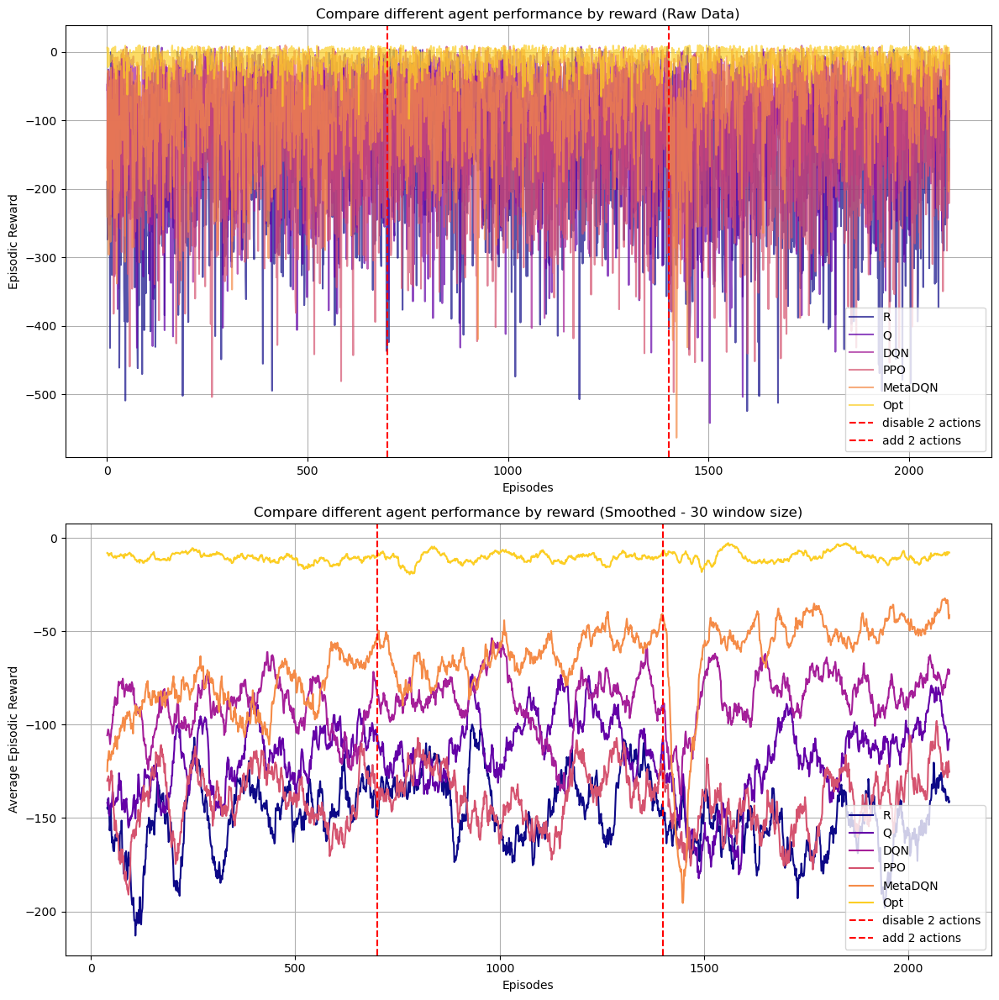

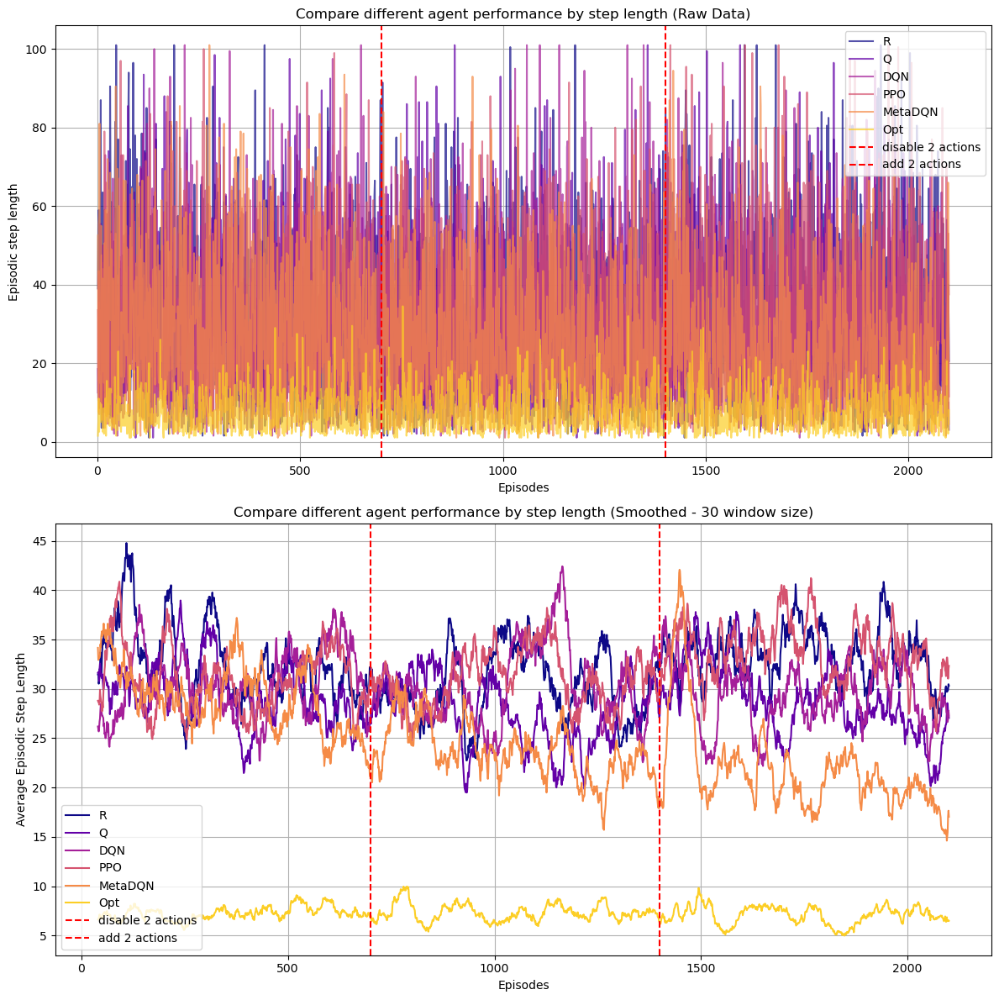

analysis for agent type: Q
Agent pre-drift average reward: -107.491
Optimal pre-drift average reward: -10.409
Recovery standard (90% of relative performance): 0.732
Recovered: True
Recovery achieved in 456 windows
========== RECOVERY EVALUATION ==========
Agent pre-drift average reward: -107.491
Optimal pre-drift average reward: -10.409
Recovery standard (90% of relative performance): 0.777
Recovered: True
Recovery achieved in 579 windows
========== RECOVERY EVALUATION ==========
analysis for agent type: DQN
Agent pre-drift average reward: -99.894
Optimal pre-drift average reward: -10.409
Recovery standard (90% of relative performance): 0.737
Recovered: True
Recovery achieved in 200 windows
========== RECOVERY EVALUATION ==========
Agent pre-drift average reward: -99.894
Optimal pre-drift average reward: -10.409
Recovery standard (90% of relative performance): 0.701
Recovered: True
Recovery achieved in 213 windows
========== RECOVERY EVALUATION ==========
analysis for agent type: PPO
A

In [20]:
test_all_agents_action()

In [ ]:
env = GeneratedENVA()
disable_actions = np.random.choice(
        env.motions[:-20],
        size=10)


/Users/veetin/Desktop/drifttest_pa/main/syn_envaction.py:39: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  frequencies[label][action] = ast.literal_eval(frequencies[label][action])


In [7]:
env.set_flag()
env.drift(add_actions=-10,disable_actions=disable_actions,drift_type='sudden')

Disabled actions: ['A97' 'A98' 'A15' 'A22' 'A54' 'A75' 'A29' 'A100' 'A37' 'A65']


In [8]:
agent = ValueIterationAgent(env)

In [ ]:
agent.value_iteration()


run value iteration
action mask: [True, True, True, True, True, True, True, True, True, True, True, True, True, True, False, True, True, True, True, True, True, False, True, True, True, True, True, True, False, True, True, True, True, True, True, True, False, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, False, True, True, True, True, True, True, True, True, True, True, False, True, True, True, True, True, True, True, True, True, False, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, False, False, True, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False]
Skipping illegal action A15
Skipping illegal action A22
Skipping illegal action A29
Skipping illegal action A37
Skipping illegal action A54
Skipping illegal action A65
Skipping illegal action A75
Skipping illegal act

In [ ]:
agent.policy

{'S1': 15,
 'S2': 63,
 'S3': 65,
 'S4': 63,
 'S5': 63,
 'S6': 50,
 'S7': 88,
 'S8': 50,
 'S9': 69,
 'S10': 69,
 'S11': 31,
 'S12': 63,
 'S13': 51,
 'S14': 77,
 'S15': 31,
 'S16': 31,
 'S17': 13,
 'S18': 41,
 'S19': 69,
 'S20': 76,
 'S21': 9,
 'S22': 63,
 'S23': 76,
 'S24': 88,
 'S25': 9,
 'S26': 15,
 'S27': 63,
 'S28': 31,
 'S29': 76,
 'S30': 12,
 'S31': 34,
 'S32': 88,
 'S33': 16,
 'S34': 82,
 'S35': 41,
 'S36': 51,
 'S37': 15,
 'S38': 63,
 'S39': 65,
 'S40': 9,
 'S41': 9,
 'S42': 9,
 'S43': 12,
 'S44': 69,
 'S45': 51,
 'S46': 69,
 'S47': 9,
 'S48': 88,
 'S49': 65,
 'S50': 31,
 'Tau': None}